# HOMEWORK 9

In this homework, you are going to use the dlib face detector and apply it to an image of your liking. You can follow the procedure shown in lesson 9. Please always comment your code so I can see what you're doing :-)

For this homework we are not going to provide you with any code, you'll have to build the face detector on your own.

### Step 0

Run the necessary imports.

In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import dlib
plt.rcParams['figure.figsize'] = [15, 10]

### Step 1

Load an image (any image that contains faces).

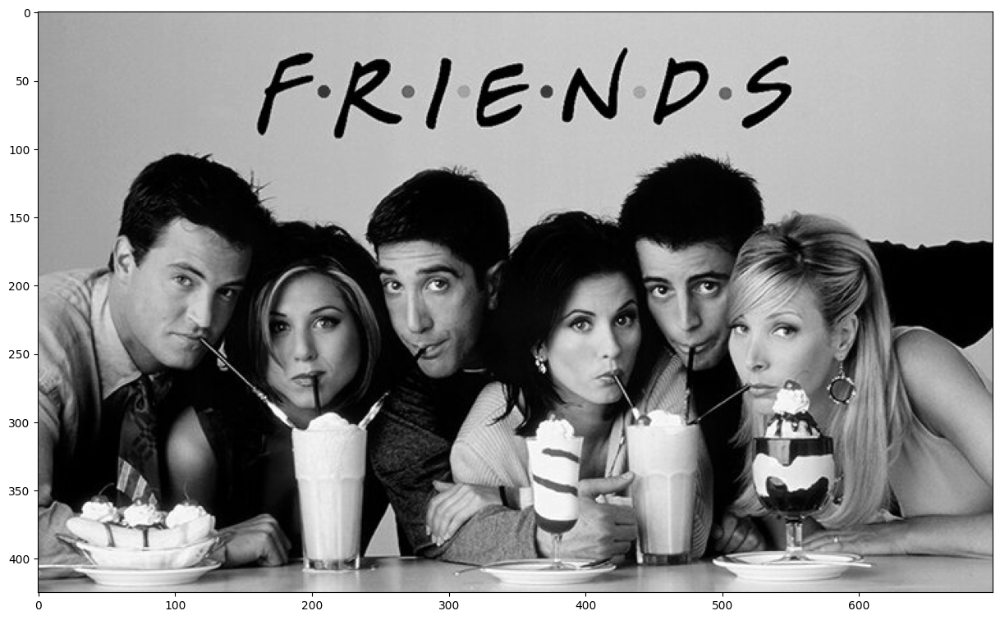

In [20]:
img = cv2.imread("data/friends.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap="gray")

### Step 2

Load the dlib face predictor.

In [16]:
# create detector object
detector = dlib.get_frontal_face_detector()


### Step 3

Run the predictor on your image.

In [18]:
# one here is upscaling parameter
rects = detector(gray, 1)
print('Number of detected faces:', len(rects))


Number of detected faces: 6


### Step 4

Draw bounding boxes around the detected faces and plot the image. Use different colour for each face.

(<matplotlib.image.AxesImage at 0x21177a430e0>, Text(0.5, 1.0, 'dlib'))

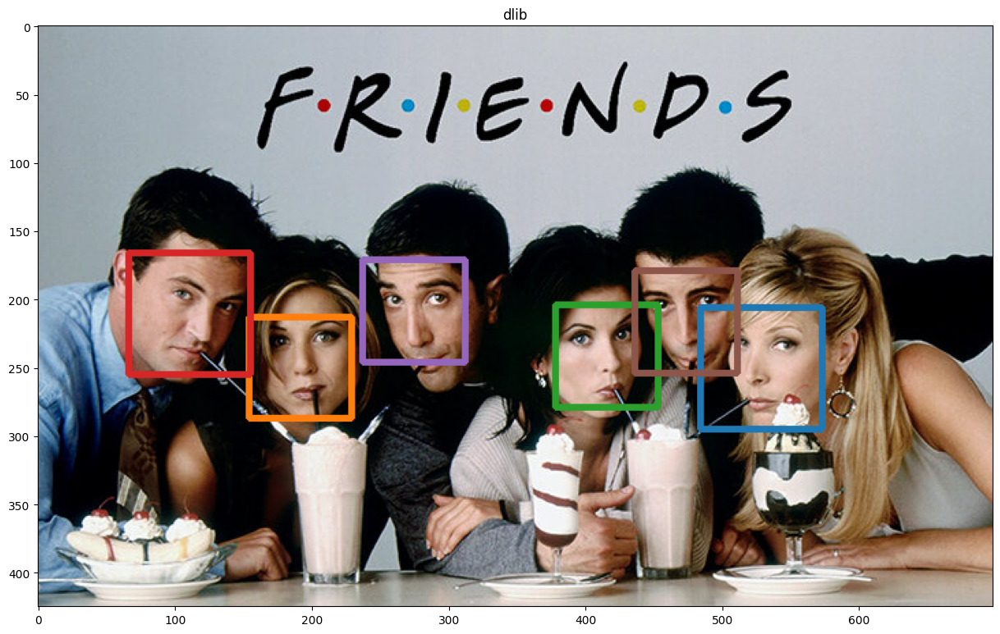

In [19]:
# here I use code provided in the lesson with some modifications ;)

def rect_to_bb(rect):
    # Dlib rect --> OpenCV rect
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y

    return (x, y, w, h)


# get tab10 pallete from matplotlib to plot the rectangles
# it gives me only 10 colors, but they are "nice" so I will stick with it
# alternatively, one can generate colors on the go with rand for example
palette = plt.cm.tab10.colors  # 'tab10' is a predefined palette with 10 colors

faces_dlib_img = []
result_dlib = np.copy(img)
for i, rect in enumerate(rects):    
    # Draw rectangle around the face
    x, y, w, h = rect_to_bb(rect)

    # using % colors will repeat after 10
    color = tuple(np.array(palette[i % len(palette)]) * 255)  # Convert to RGB (0-255)
    
    cv2.rectangle(result_dlib, (x, y), (x+w, y+h), color, 3)
    faces_dlib_img.append(img[y:y+h, x:x+w, :])


plt.imshow(result_dlib), plt.title('dlib')

### Step 5 (optional)

Repeat the process with a different and more challenging image (more faces, smaller faces, people with glasses, hats, helmets, etc.). How does the detector perform? Is it robust?

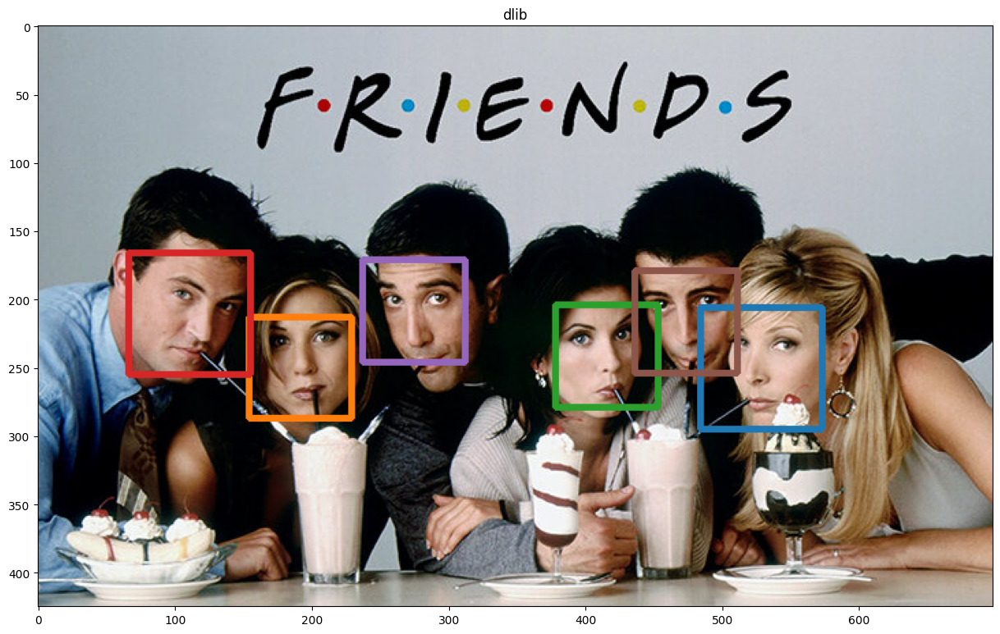

In [27]:
# lets put everything in the function

def detect_and_plot_faces(img, upscale=1):
    "We assume img loaded with cv2 in BGR"
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    detector = dlib.get_frontal_face_detector()
    rects = detector(gray, upscale)
    palette = plt.cm.tab10.colors  # 'tab10' is a predefined palette with 10 colors

    faces_dlib_img = []
    result_dlib = np.copy(img)
    for i, rect in enumerate(rects):    
        # Draw rectangle around the face
        x, y, w, h = rect_to_bb(rect)
    
        # using % colors will repeat after 10
        color = tuple(np.array(palette[i % len(palette)]) * 255)  # Convert to RGB (0-255)
        
        cv2.rectangle(result_dlib, (x, y), (x+w, y+h), color, 3)
        faces_dlib_img.append(img[y:y+h, x:x+w, :])
    
    
    plt.imshow(result_dlib), plt.title('dlib')
img_friends = cv2.imread("data/friends.jpg")
detect_and_plot_faces(img_friends)

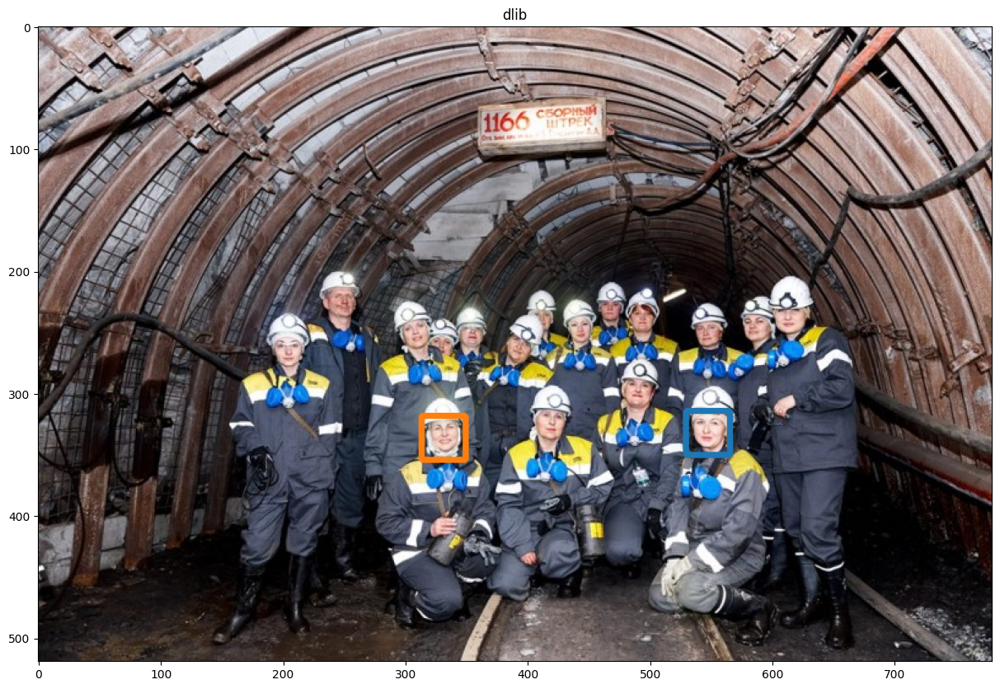

In [29]:
# source: https://energo.dtek.com/media-center/press/shakhta-glazami-zhenschin-suprugi-shakhterov-dtek-shu-dneprovskoe--pobyvali-na-rabochikh-mestakh-svoikh-muzhey/
img_miners = cv2.imread("data/miners.jpg")
detect_and_plot_faces(img_miners)

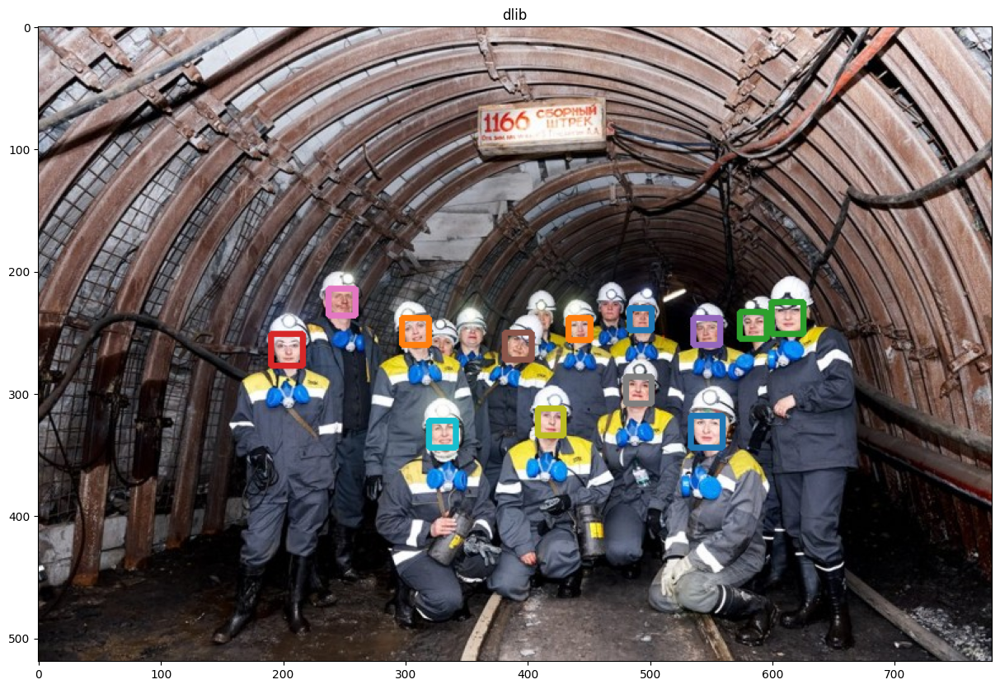

In [31]:
# I can get better result manipulating upscale, (by computing cost)
detect_and_plot_faces(img_miners, upscale=2)

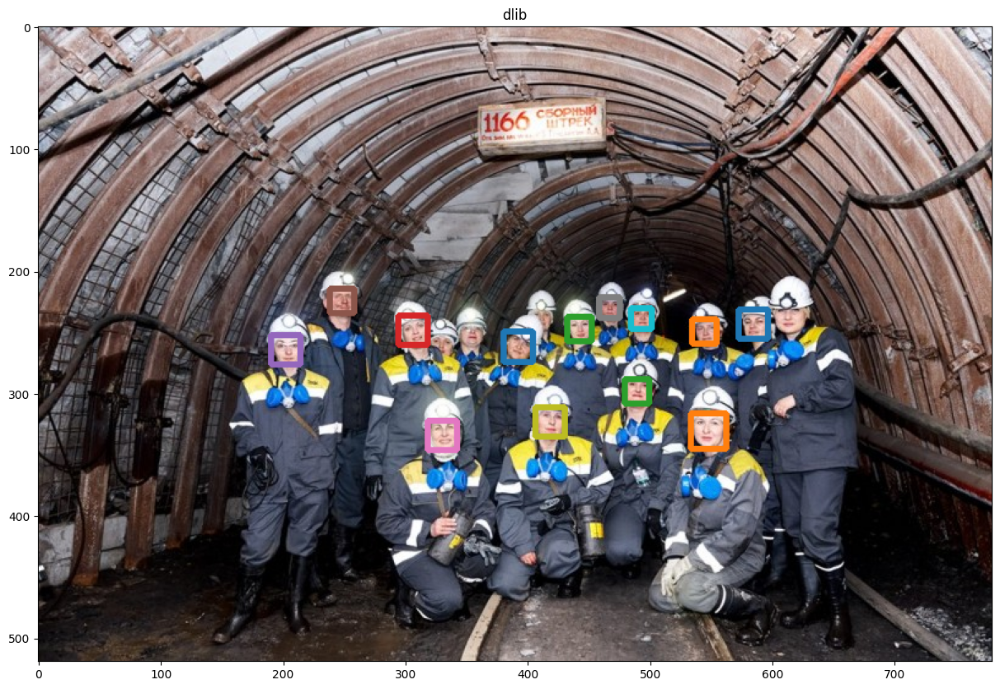

In [32]:
# lets see if I get even better
detect_and_plot_faces(img_miners, upscale=5)

useing upscale=5 did not help compared to 2, but significantly increased computation time (to almost a minute on my computer)

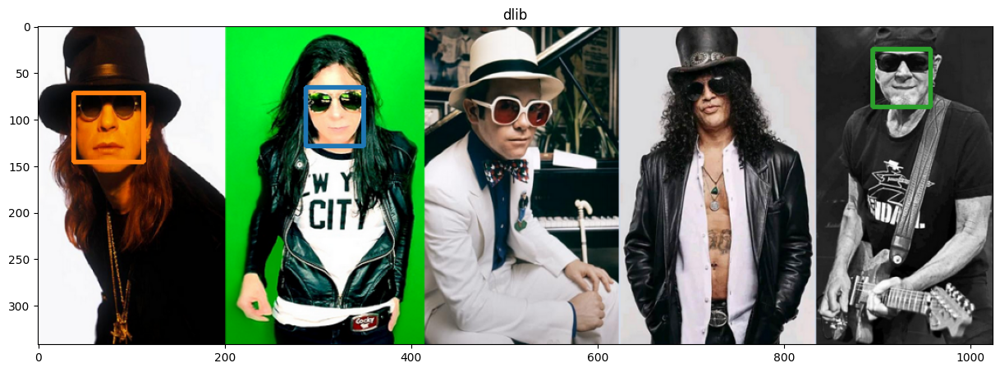

In [34]:
# source https://metalsludge.tv/metal-sludges-top-12-rockers-who-wear-glasses/
img_rockers = cv2.imread("data/rockers.png")
detect_and_plot_faces(img_rockers)

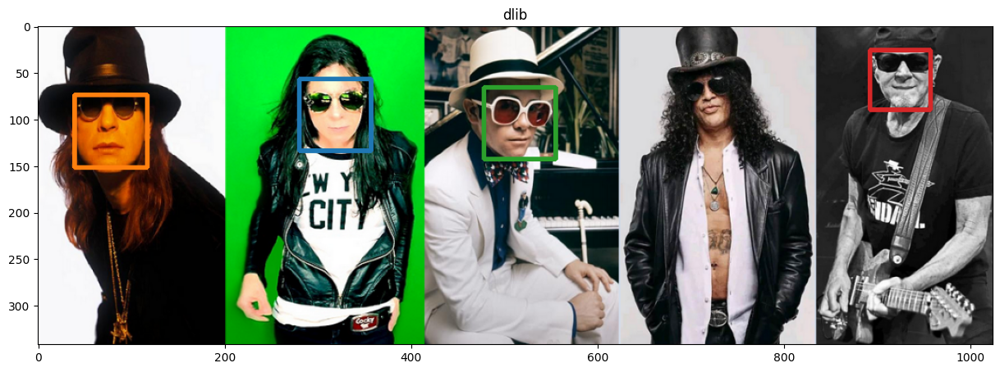

In [36]:
# the problem is not size, so I suppose upscaling will not help (or not with all)
detect_and_plot_faces(img_rockers, upscale=2)